<a href="https://colab.research.google.com/github/shrabonbiswas/Thesis_final_output/blob/main/VGG_16.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import os
import cv2
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from skimage.io import imread
from sklearn.model_selection import train_test_split

In [3]:
import os
import shutil

# Source: Google Drive file
src_file = "/content/drive/MyDrive/Thesis/dataset/thesis.zip"

# Destination: Colab local directory
dest_file = "/content/thesis.zip"

# ফাইল আছে কিনা চেক করা
if os.path.exists(src_file):
    shutil.copy(src_file, dest_file)
    print("✅ File copied successfully!")
else:
    print(f"❌ Source file পাওয়া যায়নি: {src_file}")

✅ File copied successfully!


In [4]:
import zipfile
import os

# Path to the zip file
zip_file_path = "/content/thesis.zip"

# Destination directory to unzip the file
destination_dir = "/content/thesis_dataset"

# Create the destination directory if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(destination_dir)

print(f"✅ File '{zip_file_path}' unzipped to '{destination_dir}' successfully!")

✅ File '/content/thesis.zip' unzipped to '/content/thesis_dataset' successfully!


In [5]:
# Define path to the data directory
data_dir = Path('/content/thesis_dataset')

data_dir

PosixPath('/content/thesis_dataset')

In [6]:
import pandas as pd
from pathlib import Path

# Path to dataset
data_dir = Path('/content/thesis_dataset/data')  # Change this to your dataset path

# Class directories
blight_dir = data_dir / 'Blight'
common_rust_dir = data_dir / 'Common_Rust'
gray_leaf_dir = data_dir / 'Gray_Leaf_Spot'
healthy_dir = data_dir / 'Healthy'

# Allowed image extensions
valid_extensions = ['.jpg', '.jpeg', '.JPG', '.JPEG']

# Function to get all valid images in a directory
def get_images(directory):
    return [f for f in directory.iterdir() if f.suffix in valid_extensions]

# Get image lists
blight_images = get_images(blight_dir)
common_rust_images = get_images(common_rust_dir)
gray_leaf_images = get_images(gray_leaf_dir)
healthy_images = get_images(healthy_dir)

# Build training data list with labels
train_data = []

for img in blight_images:
    train_data.append((img, 0))
for img in common_rust_images:
    train_data.append((img, 1))
for img in gray_leaf_images:
    train_data.append((img, 2))
for img in healthy_images:
    train_data.append((img, 3))

# Create a DataFrame
train_data = pd.DataFrame(train_data, columns=['image', 'label'])

# Shuffle the data
train_data = train_data.sample(frac=1.0).reset_index(drop=True)

# Preview
train_data.head()

,image,label
0,/content/thesis_dataset/data/Gray_Leaf_Spot/Co...,2
1,/content/thesis_dataset/data/Healthy/Corn_Heal...,3
2,/content/thesis_dataset/data/Gray_Leaf_Spot/Co...,2
3,/content/thesis_dataset/data/Healthy/Corn_Heal...,3
4,/content/thesis_dataset/data/Gray_Leaf_Spot/Co...,2


In [7]:
train_data.shape

(4188, 2)

label
1    1306
3    1162
0    1146
2     574
Name: count, dtype: int64


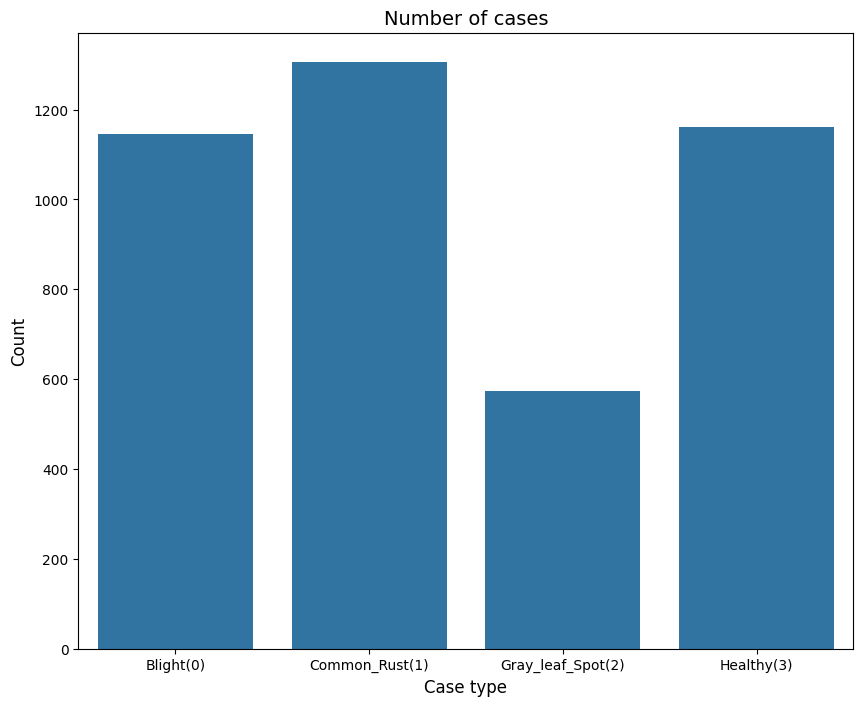

In [8]:
# Get the counts for each class
cases_count = train_data['label'].value_counts()
print(cases_count)

if not cases_count.empty:
    # Plot the results
    plt.figure(figsize=(10,8))
    sns.barplot(x=cases_count.index, y= cases_count.values)
    plt.title('Number of cases', fontsize=14)
    plt.xlabel('Case type', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(range(len(cases_count.index)), ['Blight(0)', 'Common_Rust(1)','Gray_leaf_Spot(2)','Healthy(3)'])
    plt.show()
else:
    print("No data found to plot. Please check if the image files were loaded correctly.")

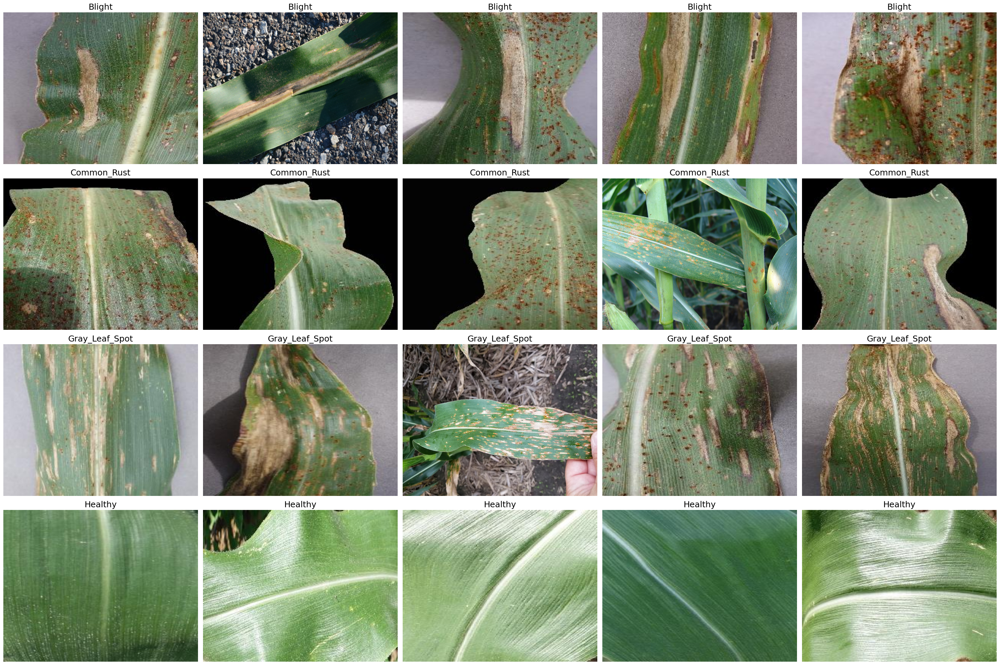

In [9]:
# Get a few samples for each class
blight_samples = (train_data[train_data['label']==0]['image'].iloc[:5]).tolist()
common_rust_samples = (train_data[train_data['label']==1]['image'].iloc[:5]).tolist()
gray_leaf_samples = (train_data[train_data['label']==2]['image'].iloc[:5]).tolist()
healthy_samples = (train_data[train_data['label']==3]['image'].iloc[:5]).tolist()

# Concat the data in a single list
samples = blight_samples + common_rust_samples + gray_leaf_samples + healthy_samples
del blight_samples, common_rust_samples, gray_leaf_samples, healthy_samples

# Plot the data
f, ax = plt.subplots(4, 5, figsize=(30, 20)) # 4 rows for 4 classes, 5 columns for 5 samples each
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

for i in range(len(samples)):
    img = imread(samples[i])
    row = i // 5
    col = i % 5
    ax[row, col].imshow(img) # Assuming images are color, remove cmap='gray'
    ax[row, col].set_title(class_names[row], fontsize=18) # Increased fontsize
    ax[row, col].axis('off')
    ax[row, col].set_aspect('auto')

plt.tight_layout() # Adjust layout to prevent titles overlapping
plt.show()

# **Data augmentation**

In [10]:
from tensorflow import keras
from tensorflow.keras import layers
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),

  ]
)

# **Preprocess**

In [11]:
from tqdm import tqdm
import tensorflow as tf
import cv2
import numpy as np

# Class directories (assuming data_dir is already defined)
blight_dir = data_dir / 'Blight'
common_rust_dir = data_dir / 'Common_Rust'
gray_leaf_dir = data_dir / 'Gray_Leaf_Spot'
healthy_dir = data_dir / 'Healthy'

img_height = 75
img_width = 75

# Allowed image extensions
valid_extensions = ['.jpg', '.jpeg', '.JPG', '.JPEG']

# Function to get all valid images in a directory
def get_images(directory):
    images = []
    for ext in valid_extensions:
        images.extend(list(directory.glob('*' + ext)))
    return images

# Get the list of all the images
blight_images = get_images(blight_dir)
common_rust_images = get_images(common_rust_dir)
gray_leaf_images = get_images(gray_leaf_dir)
healthy_images = get_images(healthy_dir)

# Create separate lists for data and labels for each class
blight_data = []
blight_labels = []
common_rust_data = []
common_rust_labels = []
gray_leaf_data = []
gray_leaf_labels = []
healthy_data = []
healthy_labels = []

# Process Blight cases (label 0)
for img_path in tqdm(blight_images, desc="Processing Blight images"):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (img_width, img_height))
    if img.shape[2] == 1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    img = img / 255.0  # Normalize to [0, 1]
    blight_data.append(img)
    blight_labels.append(0)

# Process Common Rust cases (label 1)
for img_path in tqdm(common_rust_images, desc="Processing Common Rust images"):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (img_width, img_height))
    if img.shape[2] == 1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    img = img / 255.0  # Normalize to [0, 1]
    common_rust_data.append(img)
    common_rust_labels.append(1)

# Process Gray Leaf Spot cases (label 2)
for img_path in tqdm(gray_leaf_images, desc="Processing Gray Leaf Spot images"):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (img_width, img_height))
    if img.shape[2] == 1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    img = img / 255.0  # Normalize to [0, 1]
    gray_leaf_data.append(img)
    gray_leaf_labels.append(2)

# Process Healthy cases (label 3)
for img_path in tqdm(healthy_images, desc="Processing Healthy images"):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (img_width, img_height))
    if img.shape[2] == 1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    img = img / 255.0  # Normalize to [0, 1]
    healthy_data.append(img)
    healthy_labels.append(3)



Processing Healthy images: 100%|██████████| 1162/1162 [00:00<00:00, 1861.61it/s]


# **Oversampling**

In [12]:


blight_data = np.array(blight_data)
blight_labels = np.array(blight_labels)

common_rust_data = np.array(common_rust_data)
common_rust_labels = np.array(common_rust_labels)

gray_leaf_data = np.array(gray_leaf_data)
gray_leaf_labels = np.array(gray_leaf_labels)

healthy_data = np.array(healthy_data)
healthy_labels = np.array(healthy_labels)

print("Shape of blight data:", blight_data.shape)
print("Shape of blight labels:", blight_labels.shape)
print("Shape of common rust data:", common_rust_data.shape)
print("Shape of common rust labels:", common_rust_labels.shape)
print("Shape of gray leaf spot data:", gray_leaf_data.shape)
print("Shape of gray leaf spot labels:", gray_leaf_labels.shape)
print("Shape of healthy data:", healthy_data.shape)
print("Shape of healthy labels:", healthy_labels.shape)

max_class_size = max(len(blight_data), len(common_rust_data), len(gray_leaf_data), len(healthy_data))

def augment_class(data, labels, target_size):
    num_augmented_images_needed = target_size - len(data)
    if num_augmented_images_needed <= 0:
        return data, labels

    augmented_data = np.empty((num_augmented_images_needed, img_height, img_width, 3), dtype=data.dtype)
    augmented_labels = np.empty((num_augmented_images_needed,), dtype=labels.dtype)

    for i in tqdm(range(num_augmented_images_needed)):
        random_index = np.random.randint(0, len(data))
        img = data[random_index]
        augmented_img = data_augmentation(tf.expand_dims(img, 0))
        augmented_data[i] = augmented_img[0].numpy()
        augmented_labels[i] = labels[random_index]

    data_balanced = np.concatenate((data, augmented_data), axis=0)
    labels_balanced = np.concatenate((labels, augmented_labels), axis=0)
    return data_balanced, labels_balanced

blight_data_bal, blight_labels_bal = augment_class(blight_data, blight_labels, max_class_size)
common_rust_data_bal, common_rust_labels_bal = augment_class(common_rust_data, common_rust_labels, max_class_size)
gray_leaf_data_bal, gray_leaf_labels_bal = augment_class(gray_leaf_data, gray_leaf_labels, max_class_size)
healthy_data_bal, healthy_labels_bal = augment_class(healthy_data, healthy_labels, max_class_size)

train_data1 = np.concatenate((blight_data_bal, common_rust_data_bal, gray_leaf_data_bal, healthy_data_bal), axis=0)
train_labels1 = np.concatenate((blight_labels_bal, common_rust_labels_bal, gray_leaf_labels_bal, healthy_labels_bal), axis=0)

print("Shape of combined data (train_data1):", train_data1.shape)
print("Shape of combined labels (train_labels1):", train_labels1.shape)


Shape of blight data: (1146, 75, 75, 3)
Shape of blight labels: (1146,)
Shape of common rust data: (1306, 75, 75, 3)
Shape of common rust labels: (1306,)
Shape of gray leaf spot data: (574, 75, 75, 3)
Shape of gray leaf spot labels: (574,)
Shape of healthy data: (1162, 75, 75, 3)
Shape of healthy labels: (1162,)


100%|██████████| 144/144 [00:02<00:00, 48.68it/s]


Shape of combined data (train_data1): (5224, 75, 75, 3)
Shape of combined labels (train_labels1): (5224,)


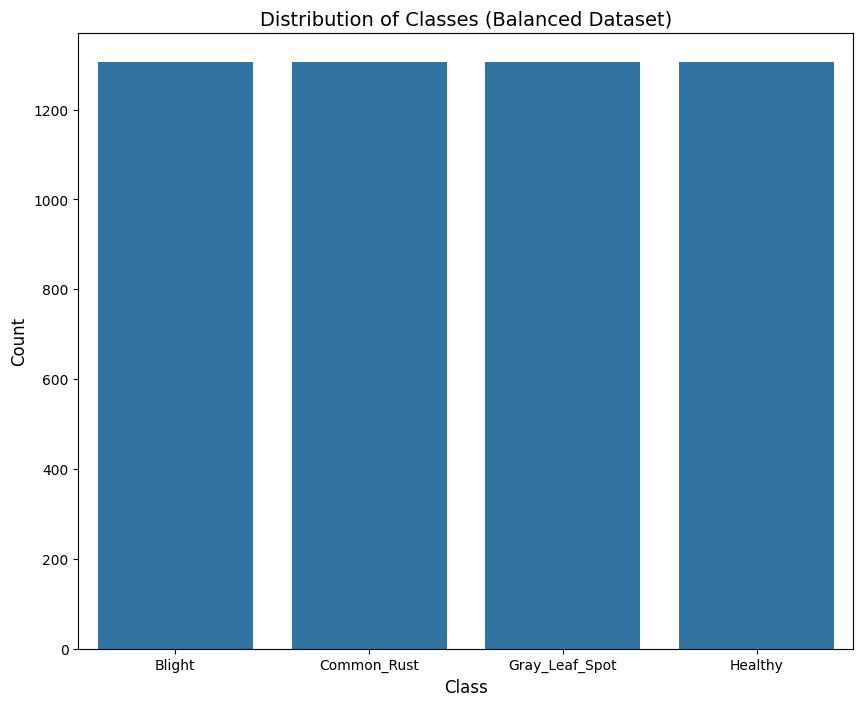

In [13]:
# Show the shapes of each class in a plot
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'train_labels1' is available from the previous cell's execution
unique_labels, counts = np.unique(train_labels1, return_counts=True)

# Class names corresponding to your labels (0, 1, 2, 3)
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

# Ensure class_names are in the same order as unique_labels
ordered_class_names = [class_names[label] for label in unique_labels]

plt.figure(figsize=(10, 8))
sns.barplot(x=ordered_class_names, y=counts)
plt.title('Distribution of Classes (Balanced Dataset)', fontsize=14)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

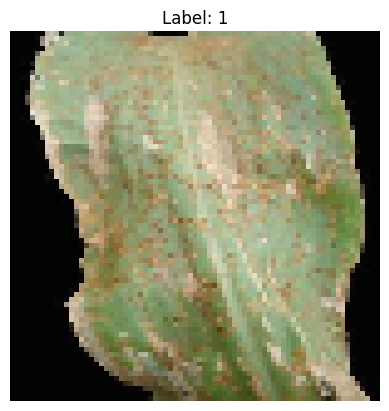

In [14]:
import random
import matplotlib.pyplot as plt
from skimage.io import imread

# Select a random index
random_index = random.randint(0, len(train_data1) - 1)

# Get the image data and label
img_data = train_data1[random_index]
label = train_labels1[random_index]


# Display the image and label
plt.imshow(img_data, cmap='gray')
plt.title(f"Label: {label}")
plt.axis('off')
plt.show()

# **Split 80 - 20**

In [15]:
X_train, X_test, y_train, y_test = train_test_split(train_data1, train_labels1, test_size=0.2, random_state=42)

In [16]:
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (4179, 75, 75, 3)
Shape of y_train: (4179,)
Shape of X_test: (1045, 75, 75, 3)
Shape of y_test: (1045,)


## Without Parameter Tuning(WOPT)

In [17]:
import tensorflow as tf
from tensorflow.keras import layers, models, applications

base_model = applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(64, activation='relu'),
    layers.Dense(4, activation='softmax')
])

model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 2, 2, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,862,660 (56.70 MB)

 Trainable params: 147,972 (578.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [18]:
# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  # Use sparse_categorical_crossentropy for integer labels
              metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=30, validation_data=(X_test, y_test))

Epoch 1/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - accuracy: 0.4920 - loss: 1.0770 - val_accuracy: 0.8249 - val_loss: 0.4799
Epoch 2/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.7799 - loss: 0.5282 - val_accuracy: 0.8469 - val_loss: 0.3916
Epoch 3/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.8208 - loss: 0.4283 - val_accuracy: 0.8488 - val_loss: 0.3756
Epoch 4/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.8481 - loss: 0.3902 - val_accuracy: 0.8517 - val_loss: 0.3703
Epoch 5/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.8460 - loss: 0.3764 - val_accuracy: 0.8593 - val_loss: 0.3429
Epoch 6/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.8578 - loss: 0.3376 - val_accuracy: 0.8632 - val_loss: 0.3293
Epoch 7/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.8815 - loss: 0.2905 - val_accuracy: 0.8670 - val_loss: 0.3434
Epoch 8/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.8862 - loss: 0.2976 - val_acc

# **Evaluate the model**

In [19]:
loss, accuracy = model.evaluate(np.array(X_test), np.array(y_test), verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

Test Loss: 0.4370
Test Accuracy: 0.8746


In [20]:
from sklearn.metrics import classification_report

y_pred = model.predict(np.array(X_test))
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(np.array(y_test), y_pred_classes))

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step
              precision    recall  f1-score   support

           0       0.88      0.75      0.81       277
           1       0.96      0.94      0.95       263
           2       0.71      0.89      0.79       238
           3       0.97      0.93      0.95       267

    accuracy                           0.87      1045
   macro avg       0.88      0.88      0.87      1045
weighted avg       0.89      0.87      0.88      1045



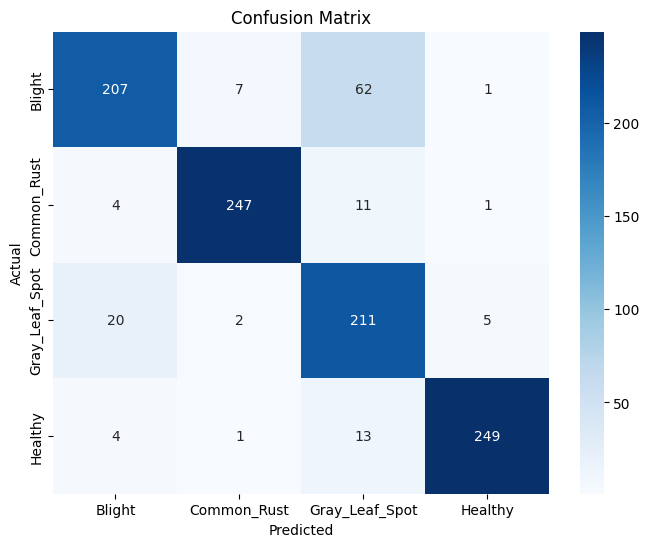

In [21]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate the confusion matrix
cm = confusion_matrix(np.array(y_test), y_pred_classes)

# Define class labels based on your dataset (0: Blight, 1: Common_Rust, 2: Gray_Leaf_Spot, 3: Healthy)
class_labels = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

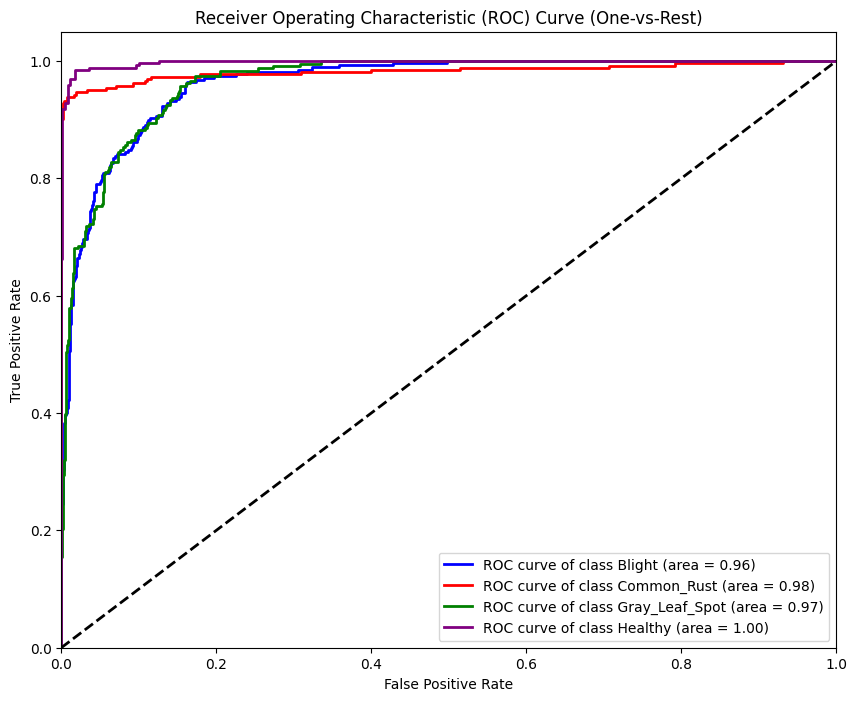

In [22]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
import numpy as np

# Binarize the labels for one-vs-rest ROC
y_test_binarized = label_binarize(np.array(y_test), classes=[0, 1, 2, 3])
n_classes = y_test_binarized.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Define colors for each class
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()

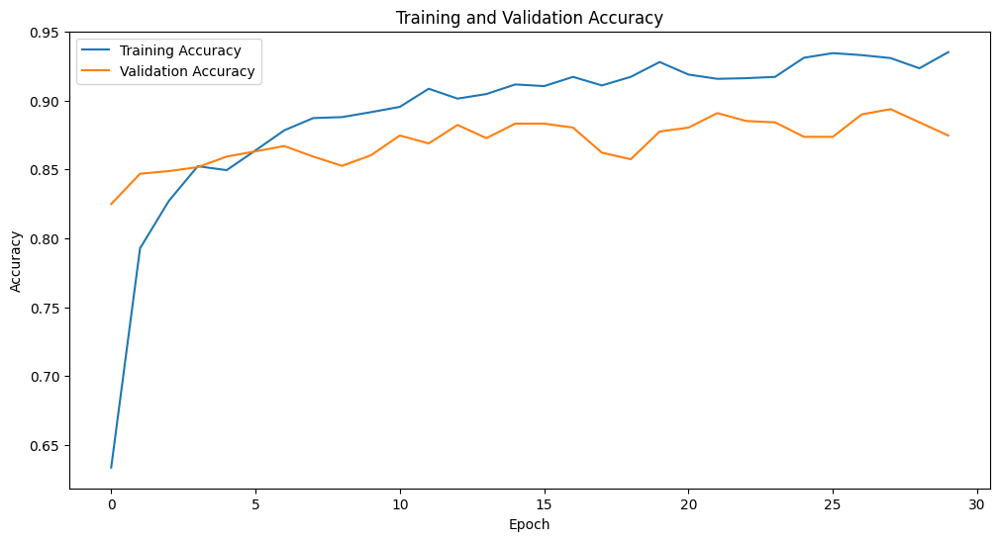

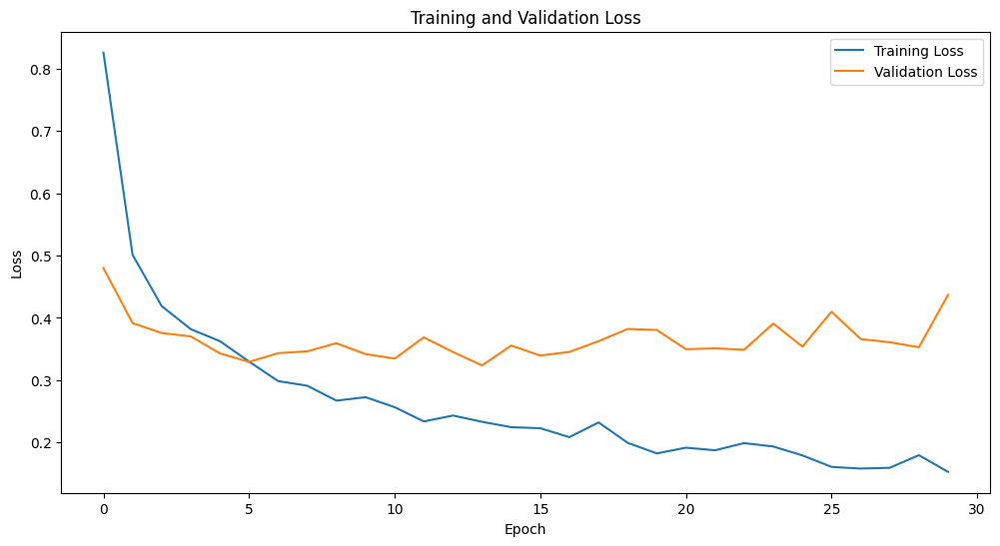

In [23]:
# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(model.history.history['accuracy'], label='Training Accuracy')
plt.plot(model.history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(model.history.history['loss'], label='Training Loss')
plt.plot(model.history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# **With parameter tuning**

In [24]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 6.7 MB/s eta 0:00:00


In [25]:
import tensorflow as tf
from tensorflow import keras
from keras import layers, models, applications
import keras_tuner as kt

def build_model(hp):

    base_model = applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

    # Freeze the layers of the base model
    for layer in base_model.layers:
        layer.trainable = False

    model = models.Sequential([
        base_model,
        layers.Flatten(),
    ])

    # Tune the number of dense layers
    num_dense_layers = hp.Int('num_dense_layers', min_value=1, max_value=3, step=1)

    for i in range(num_dense_layers):
        model.add(layers.Dense(
            units=hp.Int(f'dense_{i+1}_units', min_value=32, max_value=128, step=16),
            activation=hp.Choice(f'dense_{i+1}_activation', values=['relu', 'tanh'])
        ))
        model.add(layers.Dropout(hp.Float(f'dropout_{i+1}', min_value=0.0, max_value=0.5, step=0.1)))

    model.add(layers.Dense(4, activation='softmax'))

    # Tune the optimizer
    optimizer_choice = hp.Choice('optimizer', values=['adam', 'sgd', 'rmsprop'])

    if optimizer_choice == 'adam':
        optimizer = keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4]))
    elif optimizer_choice == 'sgd':
        optimizer = keras.optimizers.SGD(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4]))
    else:
        optimizer = keras.optimizers.RMSprop(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4]))


    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=21,
    executions_per_trial=1,
    directory='my_dir_resnet',
    project_name='intro_to_kt_resnet'
)

# Convert labels to appropriate format for binary crossentropy

# পরিবর্তন করুন:
y_train_array = tf.keras.utils.to_categorical(y_train, num_classes=4)
y_test_array  = tf.keras.utils.to_categorical(y_test, num_classes=4)


history = tuner.search(X_train, y_train_array, epochs=10, validation_data=(X_test, y_test_array))

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Available hyperparameters:")
for k, v in best_hps.values.items():
    print(f" - {k}: {v}")

# Safe helper
def hp_val(hps, name, default=None):
    return hps.values.get(name, default)


print(f"\nThe optimal number of dense layers is tunable between 1 and 3 based on the hyperparameter search.")
print(f"Dense_1 units: {hp_val(best_hps, 'dense_1_units')}")
print(f"Dense_1 activation: {hp_val(best_hps, 'dense_1_activation')}")
print(f"Dropout_1: {hp_val(best_hps, 'dropout_1')}")
print(f"Dense_2 units: {hp_val(best_hps, 'dense_2_units')}")
print(f"Dense_2 activation: {hp_val(best_hps, 'dense_2_activation')}")
print(f"Dropout_2: {hp_val(best_hps, 'dropout_2')}")
print(f"Dense_3 units: {hp_val(best_hps, 'dense_3_units')}")
print(f"Dense_3 activation: {hp_val(best_hps, 'dense_3_activation')}")


print(f"\nOptimizer: {hp_val(best_hps, 'optimizer')}")
print(f"Learning rate: {hp_val(best_hps, 'learning_rate')}")

Trial 21 Complete [00h 00m 59s]
val_accuracy: 0.882296621799469

Best val_accuracy So Far: 0.882296621799469
Total elapsed time: 00h 20m 33s
Available hyperparameters:
 - num_dense_layers: 3
 - dense_1_units: 64
 - dense_1_activation: relu
 - dropout_1: 0.2
 - optimizer: adam
 - learning_rate: 0.001
 - dense_2_units: 64
 - dense_2_activation: tanh
 - dropout_2: 0.1
 - dense_3_units: 96
 - dense_3_activation: relu
 - dropout_3: 0.2

The optimal number of dense layers is tunable between 1 and 3 based on the hyperparameter search.
Dense_1 units: 64
Dense_1 activation: relu
Dropout_1: 0.2
Dense_2 units: 64
Dense_2 activation: tanh
Dropout_2: 0.1
Dense_3 units: 96
Dense_3 activation: relu

Optimizer: adam
Learning rate: 0.001


In [26]:
# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Get the training history from the best model
history = best_model.fit(X_train, y_train_array, epochs=30, validation_data=(X_test, y_test_array))


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - accuracy: 0.9326 - loss: 0.2019 - val_accuracy: 0.8794 - val_loss: 0.3637
Epoch 2/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.9272 - loss: 0.1922 - val_accuracy: 0.8574 - val_loss: 0.3929
Epoch 3/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.9365 - loss: 0.1569 - val_accuracy: 0.8756 - val_loss: 0.3927
Epoch 4/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.9400 - loss: 0.1554 - val_accuracy: 0.8746 - val_loss: 0.3913
Epoch 5/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.9463 - loss: 0.1493 - val_accuracy: 0.8699 - val_loss: 0.4204
Epoch 6/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.9471 - loss: 0.1473 - val_accuracy: 0.8727 - val_loss: 0.4149
Epoch 7/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.9373 - loss: 0.1470 - val_accuracy: 0.8842 - val_loss: 0.4197
Epoch 8/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.9487 - loss: 0.1409 - val_ac

In [31]:
loss, accuracy = best_model.evaluate(np.array(X_test), np.array(y_test_array), verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

Test Loss: 0.4781
Test Accuracy: 0.8890


In [30]:
from sklearn.metrics import classification_report
import numpy as np

y_pred_probs = best_model.predict(np.array(X_test))
y_pred_classes = np.argmax(y_pred_probs, axis=1)


print(classification_report(np.array(y_test), y_pred_classes))

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
              precision    recall  f1-score   support

           0       0.80      0.88      0.84       277
           1       0.96      0.94      0.95       263
           2       0.83      0.76      0.80       238
           3       0.97      0.96      0.96       267

    accuracy                           0.89      1045
   macro avg       0.89      0.89      0.89      1045
weighted avg       0.89      0.89      0.89      1045



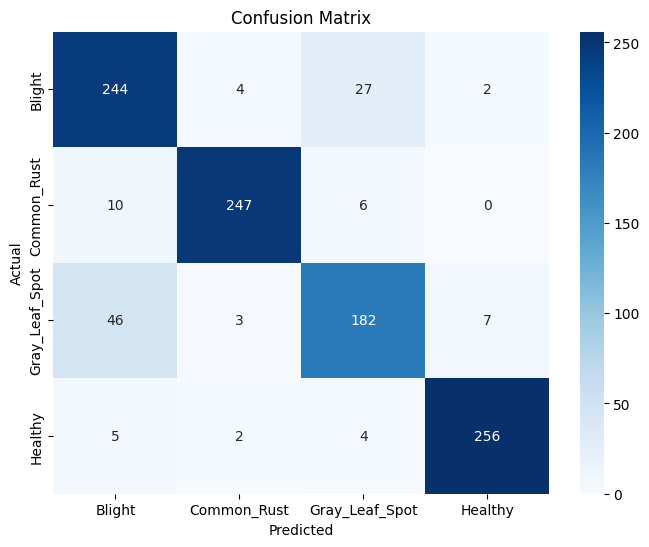

In [32]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate the confusion matrix
cm = confusion_matrix(np.array(y_test), y_pred_classes)

# Define class labels based on your dataset (0: Blight, 1: Common_Rust, 2: Gray_Leaf_Spot, 3: Healthy)
class_labels = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

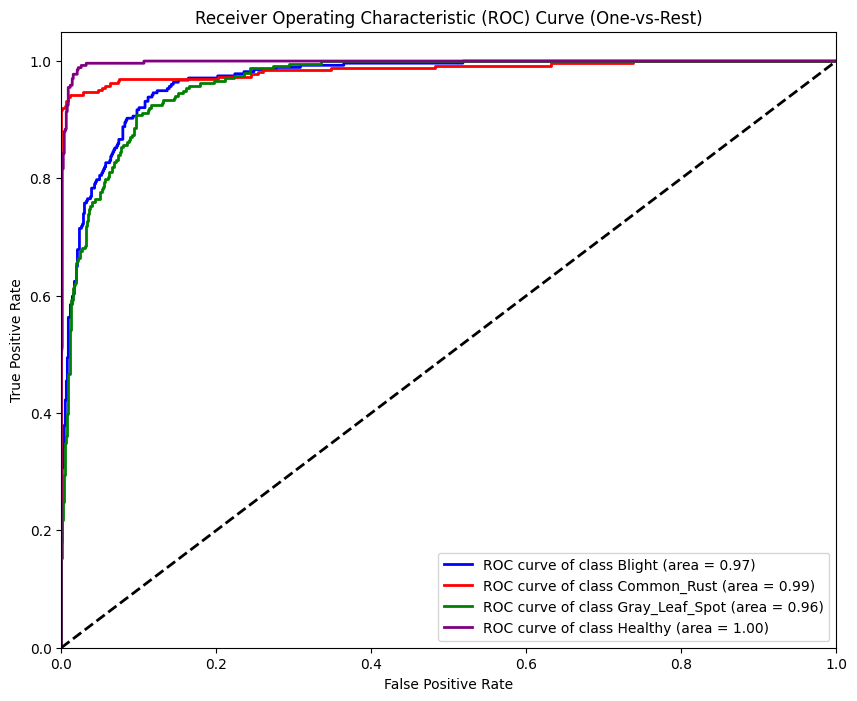

In [33]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
import numpy as np

# Binarize the labels for one-vs-rest ROC
y_test_binarized = label_binarize(np.array(y_test), classes=[0, 1, 2, 3])
n_classes = y_test_binarized.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Define colors for each class
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()

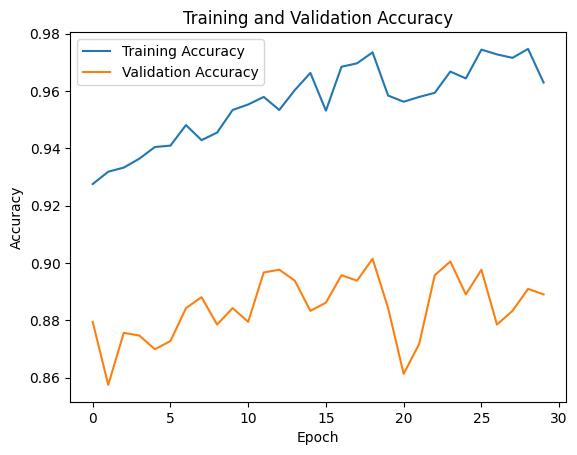

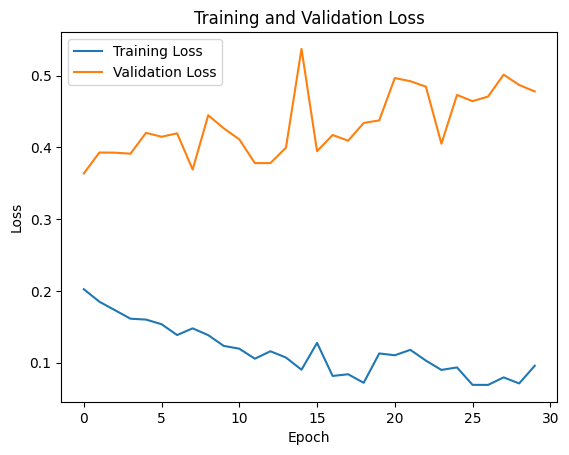

In [34]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

Split 70- 30

In [35]:
X_train, X_test, y_train, y_test = train_test_split(train_data1, train_labels1, test_size=0.3, random_state=42)

In [36]:
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (3656, 75, 75, 3)
Shape of y_train: (3656,)
Shape of X_test: (1568, 75, 75, 3)
Shape of y_test: (1568,)


# **Without parameter tuning**

In [37]:
import tensorflow as tf
from tensorflow.keras import layers, models, applications

base_model = applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(64, activation='relu'),
    layers.Dense(4, activation='softmax')
])

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 2, 2, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,862,660 (56.70 MB)

 Trainable params: 147,972 (578.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [38]:
# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  # Use sparse_categorical_crossentropy for integer labels
              metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=30, validation_data=(X_test, y_test))

Epoch 1/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - accuracy: 0.5209 - loss: 1.0473 - val_accuracy: 0.8029 - val_loss: 0.5178
Epoch 2/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.7675 - loss: 0.5572 - val_accuracy: 0.8202 - val_loss: 0.4473
Epoch 3/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8313 - loss: 0.4303 - val_accuracy: 0.8508 - val_loss: 0.3853
Epoch 4/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8301 - loss: 0.4045 - val_accuracy: 0.8476 - val_loss: 0.3887
Epoch 5/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8620 - loss: 0.3682 - val_accuracy: 0.8680 - val_loss: 0.3528
Epoch 6/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8694 - loss: 0.3509 - val_accuracy: 0.8667 - val_loss: 0.3455
Epoch 7/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8769 - loss: 0.3054 - val_accuracy: 0.8769 - val_loss: 0.3232
Epoch 8/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8941 - loss: 0.2707 - val_acc

In [39]:
loss, accuracy = model.evaluate(np.array(X_test), np.array(y_test), verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

Test Loss: 0.4498
Test Accuracy: 0.8769


In [40]:
from sklearn.metrics import classification_report

y_pred = model.predict(np.array(X_test))
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(np.array(y_test), y_pred_classes))

49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step
              precision    recall  f1-score   support

           0       0.84      0.78      0.81       414
           1       0.98      0.92      0.95       386
           2       0.75      0.86      0.80       376
           3       0.96      0.96      0.96       392

    accuracy                           0.88      1568
   macro avg       0.88      0.88      0.88      1568
weighted avg       0.88      0.88      0.88      1568



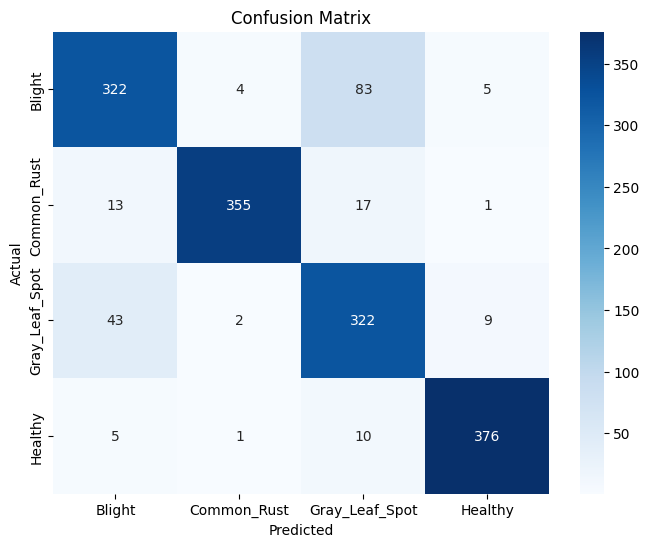

In [41]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate the confusion matrix
cm = confusion_matrix(np.array(y_test), y_pred_classes)

# Define class labels based on your dataset (0: Blight, 1: Common_Rust, 2: Gray_Leaf_Spot, 3: Healthy)
class_labels = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

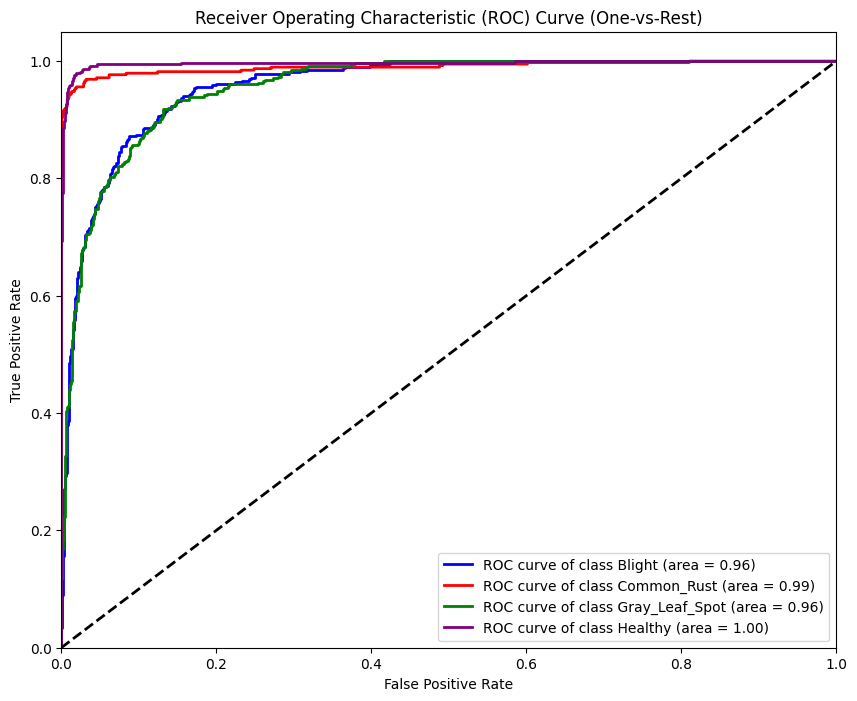

In [42]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
import numpy as np

# Binarize the labels for one-vs-rest ROC
y_test_binarized = label_binarize(np.array(y_test), classes=[0, 1, 2, 3])
n_classes = y_test_binarized.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Define colors for each class
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()

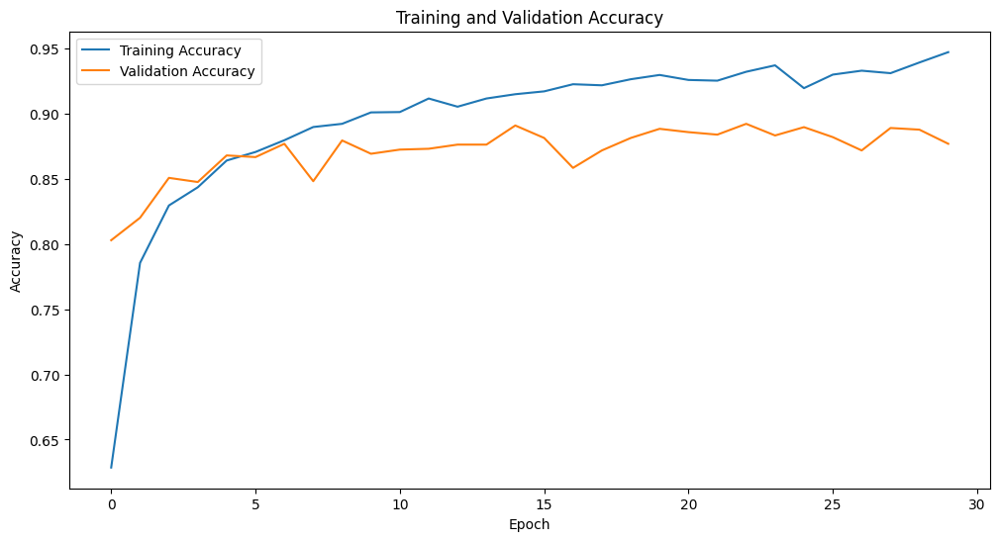

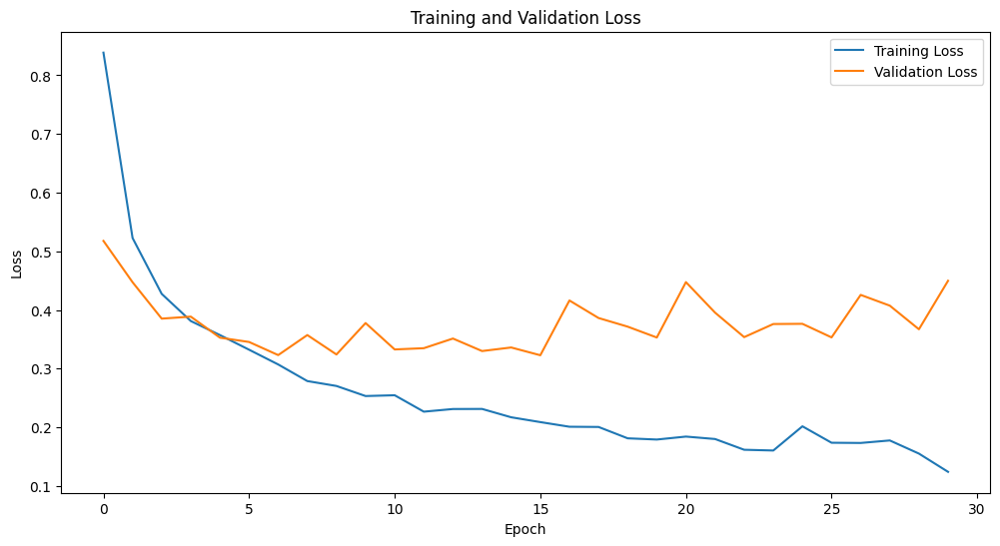

In [43]:
# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(model.history.history['accuracy'], label='Training Accuracy')
plt.plot(model.history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(model.history.history['loss'], label='Training Loss')
plt.plot(model.history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

Without parameter tuning

In [44]:
!pip install keras_tuner

In [45]:
import tensorflow as tf
from tensorflow import keras
from keras import layers, models, applications
import keras_tuner as kt

def build_model(hp):

    base_model = applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

    # Freeze the layers of the base model
    for layer in base_model.layers:
        layer.trainable = False

    model = models.Sequential([
        base_model,
        layers.Flatten(),
    ])

    # Tune the number of dense layers
    num_dense_layers = hp.Int('num_dense_layers', min_value=1, max_value=3, step=1)

    for i in range(num_dense_layers):
        model.add(layers.Dense(
            units=hp.Int(f'dense_{i+1}_units', min_value=32, max_value=128, step=16),
            activation=hp.Choice(f'dense_{i+1}_activation', values=['relu', 'tanh'])
        ))
        model.add(layers.Dropout(hp.Float(f'dropout_{i+1}', min_value=0.0, max_value=0.5, step=0.1)))

    model.add(layers.Dense(4, activation='softmax'))

    # Tune the optimizer
    optimizer_choice = hp.Choice('optimizer', values=['adam', 'sgd', 'rmsprop'])

    if optimizer_choice == 'adam':
        optimizer = keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4]))
    elif optimizer_choice == 'sgd':
        optimizer = keras.optimizers.SGD(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4]))
    else:
        optimizer = keras.optimizers.RMSprop(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4]))


    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=21,
    executions_per_trial=1,
    directory='my_dir_resnet',
    project_name='intro_to_kt_resnet'
)

# Convert labels to appropriate format for binary crossentropy

# পরিবর্তন করুন:
y_train_array = tf.keras.utils.to_categorical(y_train, num_classes=4)
y_test_array  = tf.keras.utils.to_categorical(y_test, num_classes=4)


history = tuner.search(X_train, y_train_array, epochs=10, validation_data=(X_test, y_test_array))

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Available hyperparameters:")
for k, v in best_hps.values.items():
    print(f" - {k}: {v}")

# Safe helper
def hp_val(hps, name, default=None):
    return hps.values.get(name, default)


print(f"\nThe optimal number of dense layers is tunable between 1 and 3 based on the hyperparameter search.")
print(f"Dense_1 units: {hp_val(best_hps, 'dense_1_units')}")
print(f"Dense_1 activation: {hp_val(best_hps, 'dense_1_activation')}")
print(f"Dropout_1: {hp_val(best_hps, 'dropout_1')}")
print(f"Dense_2 units: {hp_val(best_hps, 'dense_2_units')}")
print(f"Dense_2 activation: {hp_val(best_hps, 'dense_2_activation')}")
print(f"Dropout_2: {hp_val(best_hps, 'dropout_2')}")
print(f"Dense_3 units: {hp_val(best_hps, 'dense_3_units')}")
print(f"Dense_3 activation: {hp_val(best_hps, 'dense_3_activation')}")


print(f"\nOptimizer: {hp_val(best_hps, 'optimizer')}")
print(f"Learning rate: {hp_val(best_hps, 'learning_rate')}")

Reloading Tuner from my_dir_resnet/intro_to_kt_resnet/tuner0.json
Available hyperparameters:
 - num_dense_layers: 3
 - dense_1_units: 64
 - dense_1_activation: relu
 - dropout_1: 0.2
 - optimizer: adam
 - learning_rate: 0.001
 - dense_2_units: 64
 - dense_2_activation: tanh
 - dropout_2: 0.1
 - dense_3_units: 96
 - dense_3_activation: relu
 - dropout_3: 0.2

The optimal number of dense layers is tunable between 1 and 3 based on the hyperparameter search.
Dense_1 units: 64
Dense_1 activation: relu
Dropout_1: 0.2
Dense_2 units: 64
Dense_2 activation: tanh
Dropout_2: 0.1
Dense_3 units: 96
Dense_3 activation: relu

Optimizer: adam
Learning rate: 0.001


In [46]:
# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Get the training history from the best model
history = best_model.fit(X_train, y_train_array, epochs=30, validation_data=(X_test, y_test_array))


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - accuracy: 0.9325 - loss: 0.1764 - val_accuracy: 0.8878 - val_loss: 0.3056
Epoch 2/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.9344 - loss: 0.1787 - val_accuracy: 0.8999 - val_loss: 0.2885
Epoch 3/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9294 - loss: 0.1786 - val_accuracy: 0.8999 - val_loss: 0.3145
Epoch 4/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9476 - loss: 0.1633 - val_accuracy: 0.9031 - val_loss: 0.2889
Epoch 5/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9519 - loss: 0.1408 - val_accuracy: 0.9094 - val_loss: 0.3044
Epoch 6/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9571 - loss: 0.1233 - val_accuracy: 0.8986 - val_loss: 0.3087
Epoch 7/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.9362 - loss: 0.1627 - val_accuracy: 0.9037 - val_loss: 0.2953
Epoch 8/30
115/115 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.9488 - loss: 0.1338 - val_acc

In [47]:
loss, accuracy = best_model.evaluate(np.array(X_test), np.array(y_test_array), verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

Test Loss: 0.5682
Test Accuracy: 0.8839


In [48]:
from sklearn.metrics import classification_report
import numpy as np

y_pred_probs = best_model.predict(np.array(X_test))
y_pred_classes = np.argmax(y_pred_probs, axis=1)


print(classification_report(np.array(y_test), y_pred_classes))

49/49 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step
              precision    recall  f1-score   support

           0       0.87      0.77      0.82       414
           1       0.95      0.96      0.95       386
           2       0.83      0.82      0.83       376
           3       0.87      0.99      0.93       392

    accuracy                           0.88      1568
   macro avg       0.88      0.89      0.88      1568
weighted avg       0.88      0.88      0.88      1568



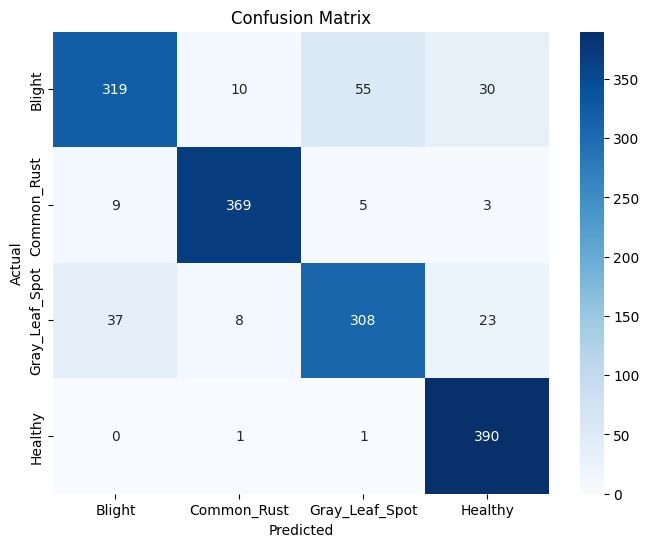

In [49]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate the confusion matrix
cm = confusion_matrix(np.array(y_test), y_pred_classes)

# Define class labels based on your dataset (0: Blight, 1: Common_Rust, 2: Gray_Leaf_Spot, 3: Healthy)
class_labels = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

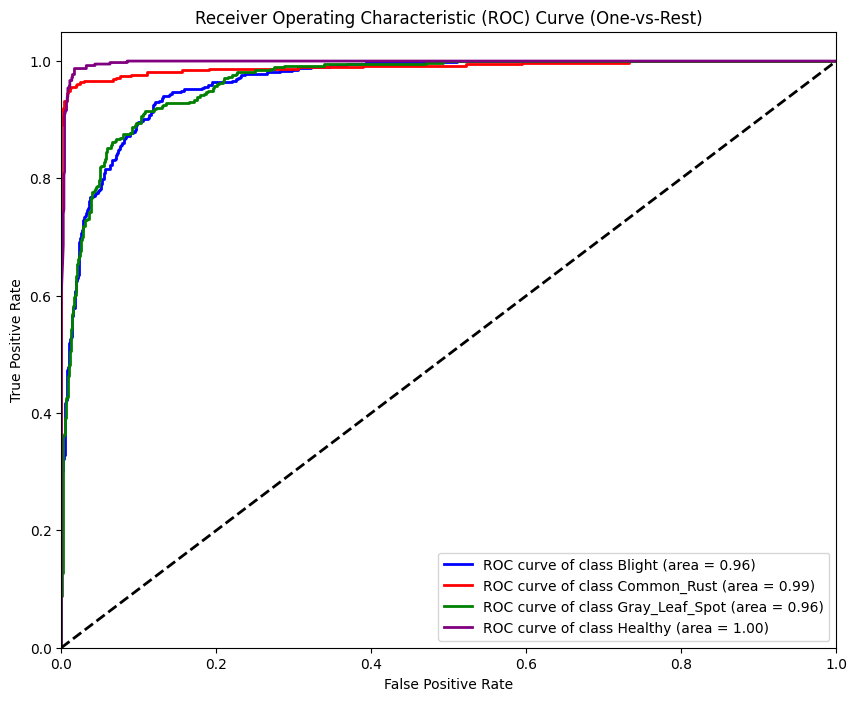

In [50]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
import numpy as np

# Binarize the labels for one-vs-rest ROC
y_test_binarized = label_binarize(np.array(y_test), classes=[0, 1, 2, 3])
n_classes = y_test_binarized.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Define colors for each class
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()

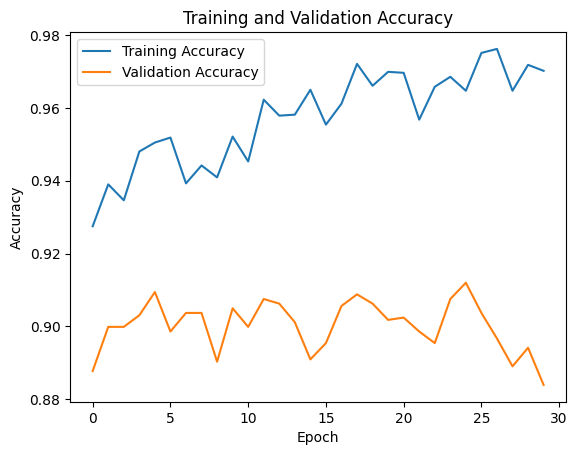

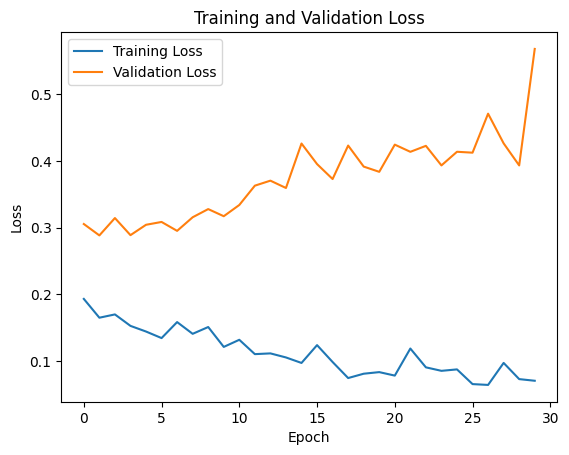

In [51]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
The predicted class for the image is: Blight


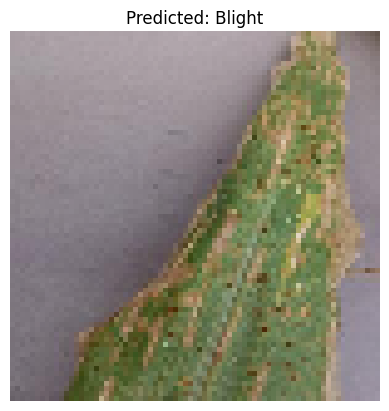

In [55]:
# Load and preprocess a sample image for prediction
image_path = '/content/thesis_dataset/data/Blight/Corn_Blight (1001).JPG' # Replace with the path to your image
img = cv2.imread(image_path)
img = cv2.resize(img, (img_width, img_height))
if img.shape[2] == 1:
    img = np.dstack([img, img, img])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = np.array(img)
img = img / 255.0  # Normalize to [0, 1]
img = np.expand_dims(img, axis=0) # Add batch dimension

# Make a prediction
predictions = best_model.predict(img)
predicted_class = np.argmax(predictions, axis=1)[0]

# Define class names
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

print(f"The predicted class for the image is: {class_names[predicted_class]}")

# Optionally, display the image
plt.imshow(img[0])
plt.title(f"Predicted: {class_names[predicted_class]}")
plt.axis('off')
plt.show()

In [57]:
import cv2
import numpy as np
import os

# Define image dimensions (assuming these are already defined earlier in the notebook)
# img_width, img_height = target_size # Uncomment if not globally available

# Path to the image to predict
image_path = '/content/thesis_dataset/data/Blight/Corn_Blight (1001).JPG' # Replace with image path

# Load the image
img = cv2.imread(str(image_path))

# Check if the image was loaded successfully
if img is None:
    print(f"Error: Unable to load image from {image_path}")
else:
    # Preprocess the image
    img = cv2.resize(img, (img_width, img_height))
    if img.shape[2] == 1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    img = img / 255.0  # Normalize to [0, 1]

    # Add batch dimension for prediction
    img = np.expand_dims(img, axis=0)

    # Make a prediction
    predictions = best_model.predict(img) # Use best_model instead of best_model2

    # Get the predicted class index
    predicted_class_index = np.argmax(predictions, axis=1)[0]

    # Get the actual class name using the index (assuming class_names is defined)
    # If class_names is not defined, you might need to define it here
    class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy'] # Example

    if 'class_names' in locals() or 'class_names' in globals():
        predicted_class_name = class_names[predicted_class_index]
        print(f"Predicted class name: {predicted_class_name}")
    else:
        print(f"Predicted class index: {predicted_class_index}")
        print("Class names are not defined. Cannot print class name.")


    # Optional: Print confidence scores
    print("Confidence scores:")
    if 'class_names' in locals() or 'class_names' in globals():
        for i, score in enumerate(predictions[0]):
            print(f"  {class_names[i]}: {score:.4f}")
    else:
         for i, score in enumerate(predictions[0]):
            print(f"  Class {i}: {score:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Predicted class name: Blight
Confidence scores:
  Blight: 0.9965
  Common_Rust: 0.0000
  Gray_Leaf_Spot: 0.0034
  Healthy: 0.0000
